In [1]:
#Non SciPy Libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt


In [132]:
#SciPy Libraries
#For randomly selecting a percentage of data for training, and the rest for testing
from sklearn.model_selection import train_test_split

#Importing Random Forest
from sklearn.ensemble import RandomForestRegressor 

#Error Metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error

#For visualizing the Decision Tree
from sklearn.tree import plot_tree

In [3]:
#Importing Iron Alloys Dataset
dataset_old = pd.read_csv('iron_alloys.csv')

#Replacing NaN with 0
dataset_old = dataset_old.fillna(0)

#Identifying each key in Iron Alloys Dataset. This is important for extracting the desired composition features. 
keys = dataset_old.keys()
print('There are %s keys.' %len(keys))

#print(keys[0:15],'\n')
#print(keys[15:30],'\n')
#print(keys[30:45],'\n')
#print(keys[45:60],'\n')
#print(keys[60:75],'\n')
#print(keys[75:90],'\n')
#print(keys[90:110],'\n')

#From the key-printing above, Key 14 is our label, 'Melting Onset (Solidus) (F)'
#Key 48 is our primary feature, 'Iron (Fe)Fe min'
#Each key onwards will contain our secondary features, which contain the maximum concentrations of the other components. 

There are 110 keys.


In [242]:
#Defining Features and Making New Dataset
#Our only features are the minimum iron composition, and the maximum concentrations of the other components. 

label = ['Melting Onset (Solidus) (F)']
features = ["Iron (Fe)Fe min"] + [col for col in dataset_old.columns[50:] if "max" in col]
features.remove('Residualsres. max')
print(features)

#Making a Dataset which only contains the label and features. 
dataset = dataset_old[label + features]
#print(dataset)

['Iron (Fe)Fe min', 'Carbon (C)C max', 'Silicon (Si)Si max', 'Manganese (Mn)Mn max', 'Phosphorus (P)P max', 'Sulfur (S)S max', 'Chromium (Cr)Cr max', 'Molybdenum (Mo)Mo max', 'Nickel (Ni)Ni max', 'Copper (Cu)Cu max', 'Vanadium (V)V max', 'Aluminum (Al)Al max', 'Magnesium (Mg)Mg max', 'Selenium (Se)Se max', 'Tin (Sn)Sn max', 'Arsenic (As)As max', 'Titanium (Ti)Ti max', 'Zirconium (Zr)Zr max', 'Niobium (Nb)Nb max', 'Nitrogen (N)N max', 'Cobalt (Co)Co max', 'Tungsten (W)W max', 'Calcium (Ca)Ca max', 'Boron (B)B max', 'Oxygen (O)O max', 'Tantalum (Ta)Ta max', 'Cerium (Ce)Ce max', 'Lanthanum (La)La max', 'Zinc (Zn)Zn max', 'Lead (Pb)Pb max']


In [248]:
#Splitting the Data into Training and Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(dataset[features], dataset[label], test_size=0.2, random_state=20)

#Making sure x and y data have correct shape
print(Y_test.shape)
print(X_test.shape,'\n')

#Correcting the shape of Y-arrays so that they are 1D. 
Y_train = np.ravel(Y_train)
Y_test = np.ravel(Y_test)

#Checking Shape of Y data to make sure y data is 1D. 
print(len(Y_test.shape))

(279, 1)
(279, 30) 

1


In [250]:
#Making and fitting our random forest regressor to the data. 
RF = RandomForestRegressor()
RF.fit(X_train,Y_train)

RandomForestRegressor()

In [88]:
#Generating prediction data from the random forest. 
Y_pred_train = RF.predict(X_train)
Y_pred_test = RF.predict(X_test)

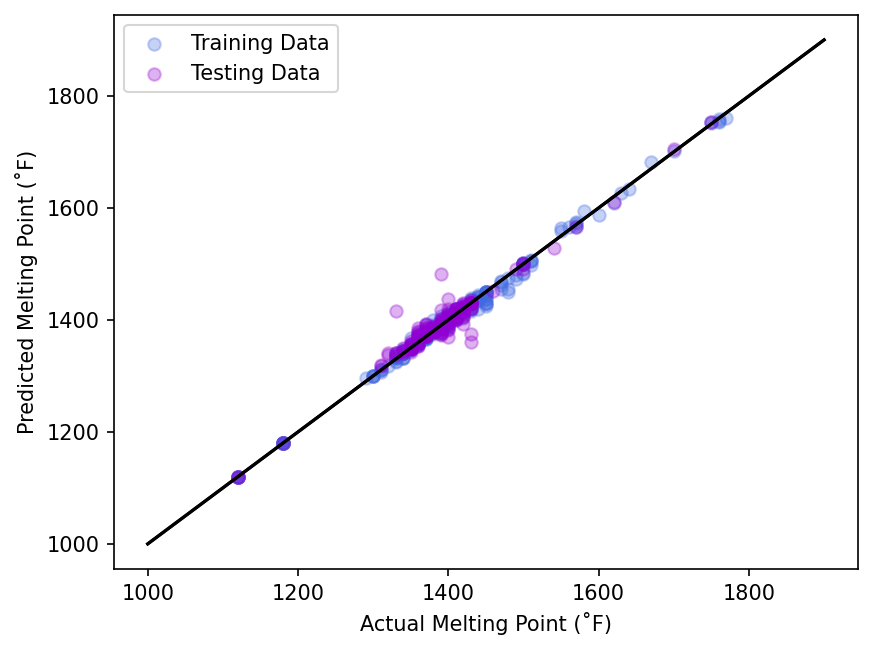

In [239]:
#Graphing Training Data and Testing Data

#Producing a figure which contains predicted melting points vs actual melting points for both training and testing data. 
plt.figure(dpi =1 50)
plt.scatter(Y_train, Y_pred_train, c = 'royalblue', alpha = 0.30, label = 'Training Data')
plt.xlabel('Actual Melting Point (˚F)')
plt.ylabel('Predicted Melting Point (˚F)')
plt.plot([1000,1900],[1000,1900], c = 'black')
plt.scatter(Y_test, Y_pred_test, c = 'darkviolet', alpha = 0.30, label = 'Testing Data')
plt.plot([1000,1900],[1000,1900], c = 'black')
plt.legend()

In [90]:
#Mean Absolute Error of Training/Testing Data
MAE_train = mean_absolute_error(Y_pred_train,Y_train)
MAE_test = mean_absolute_error(Y_pred_test,Y_test)
print(f'MAE for training data is {round(MAE_train,2)} F. MAE for testing data is {round(MAE_test,2)} F.')

#Mean Squared Error of Training/Testing Data
MSE_train = mean_squared_error(Y_pred_train,Y_train)
MSE_test = mean_squared_error(Y_pred_test,Y_test)
print(f'MSE for training data is {round(MSE_train,2)} F^2. MSE for testing data is {round(MSE_test,2)} F^2.')

MAE for training data is 1.85 F. MAE for testing data is 5.08 F.
MSE for training data is 14.95 F^2. MSE for testing data is 136.03 F^2.


In [252]:
#R^2 Scores of the fit
print(f'Training R^2 = {round(RF.score(X_train,Y_train),3)}')
print(f'Testing R^2 = {round(RF.score(X_test,Y_test),3)}')

Training R^2 = 0.995
Testing R^2 = 0.951


In [258]:
#Demonstrating the 1st decision tree
#Use estimators attribute to do this. 

tree_to_plot = RF.estimators_[0]
plt.figure(figsize=(300, 50))
plot_tree(tree_to_plot, feature_names=features , filled=True, rounded=True, fontsize=10)
plt.title("Decision Tree from Random Forest")

#Saving it as a jpg
plt.savefig('Tree1.jpg')

In [255]:
#Demonstrating the 100th decision tree
tree_to_plot2 = RF.estimators_[99]
plt.figure(figsize=(300, 50))
plot_tree(tree_to_plot2, feature_names=features , filled=True, rounded=True, fontsize=10)
plt.title("Decision Tree from Random Forest")

#Saving it as a jpg
plt.savefig('Tree100.jpg')

In [302]:
#Extracting feature importances
importances = RF.feature_importances_

#Assigning features to importances
fimportance = dict(zip(features,importances))
#print(fimportance)

#Revealing the most important feature
feature1 = np.argmax(importances)
print(f'The most important feature is the %s composition.' %features[feature1])

The most important feature is the Tungsten (W)W max composition.
